# **Assignment 7**
## Johnny Rodriguez


# Introduction - My IT Support Ticket Data Set

This dataset was taken from a recent former job.  It was  exported from an enterprise IT Helpdesk system representing IT support tickets for a liberal arts college in New York City.  The IT support ticket data spans a two year period for student, staff and faculty users.  The data set was anonymized and comments/descriptive text that identifies individuals and their issues was removed.


IT support ticket data is generated whenever a user interacts with IT technicians supporting the organizaion's technology assests and processes.  The two year period represents about 14000 of these user/technician interactions to resolve IT support requests.

______________
# Data Exploration
We import the dataset from the github repo


In [469]:
import pandas as pd
import numpy as np
from google.colab import data_table
import matplotlib.pyplot as plt
data_table.enable_dataframe_formatter()

url = 'https://raw.githubusercontent.com/johnnydrodriguez/data602project/main/IT_Tickets_2022_2021.csv'
df = pd.read_csv(url)

# Data Set Summary 


In [470]:
# Number rows and columns
num_rows = df.shape[0]
num_cols = df.shape[1]
print(f'The dataset has {num_rows} rows and {num_cols} columns.')

print('')
print(df.describe())

data_table.DataTable(df, include_index=False, num_rows_per_page=10)

The dataset has 14069 rows and 11 columns.

       sys_mod_count  reassignment_count
count   14069.000000        14069.000000
mean        6.872486            0.446727
std         7.650403            1.041276
min         0.000000            0.000000
25%         3.000000            0.000000
50%         5.000000            0.000000
75%         8.000000            0.000000
max       215.000000           10.000000


,number,contact_type,u_wait_reason,assignment_group,closed_at,resolved_at,u_subcategory,u_symptom,opened_at,sys_mod_count,reassignment_count
0,INC0120526,Self-service,NaN,Service Desk,11/4/22 18:00,11/1/22 18:00,Computer (Desktop/Laptop),How To/Question,10/21/22 17:03,11,0
1,INC0120422,Email,NaN,Service Desk,11/4/22 18:00,11/1/22 18:00,ERP,Configure/Modify,10/18/22 10:52,9,2
2,INC0120775,Phone,NaN,Service Desk,NaN,NaN,Desktop Application,Security/Policy Breach,11/4/22 12:18,5,0
3,INC0120683,Email,NaN,Enterprise Applications,11/4/22 17:00,11/1/22 17:00,ERP,Configure/Modify,11/1/22 9:37,7,1
4,INC0120358,Email,NaN,Enterprise Applications,NaN,NaN,ERP,Configure/Modify,10/13/22 10:36,14,1
...,...,...,...,...,...,...,...,...,...,...,...
14064,INC0104928,Email,NaN,Enterprise Applications,1/7/21 11:00,1/4/21 11:00,Other/Not Listed,Error/Bug,1/2/21 20:01,4,1
14065,INC0104951,Email,NaN,Enterprise Applications,1/7/21 11:00,1/4/21 11:00,Portal,Error/Bug,1/4/21 10:19,3,1
14066,INC0104954,NaN,NaN,Service Desk,1/7/21 11:00,1/4/21 11:00,ERP,Password,1/4/21 10:47,2,0
14067,INC0104937,Phone,NaN,Service Desk,1/7/21 10:00,1/4/21 10:00,College Account/Identity Mgmt,Password,1/3/21 22:24,3,0


# Data Wrangling
Create a subset of your original data and perform the following.  


In [471]:
#Modify multiple column names.

df = df.rename(columns={'number':'incident_number', 'u_wait_reason': 'wait_reason', 'u_subcategory': 'subcategory', 'sys_mod_count':'update_count', 'u_symptom': 'symptom'})
print(df.columns)


Index(['incident_number', 'contact_type', 'wait_reason', 'assignment_group',
       'closed_at', 'resolved_at', 'subcategory', 'symptom', 'opened_at',
       'update_count', 'reassignment_count'],
      dtype='object')


In [472]:
#Look at the structure of your data – are any variables improperly coded? Such as strings or characters? Convert to correct structure if needed.

# The date time columns are converted from string obects to datatime values for calculations later in the notebook

df['closed_at' ] = pd.to_datetime(df['closed_at'])
df['resolved_at'] = pd.to_datetime(df['resolved_at'])
df['opened_at'] = pd.to_datetime(df['opened_at'])
print('-------------------')

#after conversion
print(df.dtypes)

-------------------
incident_number               object
contact_type                  object
wait_reason                   object
assignment_group              object
closed_at             datetime64[ns]
resolved_at           datetime64[ns]
subcategory                   object
symptom                       object
opened_at             datetime64[ns]
update_count                   int64
reassignment_count             int64
dtype: object


In [473]:
#Create new columns based on existing columns or calculations.

# Duration and Status columns were created based on calculation of the date time values

df['duration_days'] = ((df['resolved_at'] - df['opened_at']).dt.total_seconds() / (3600 * 24)).round(2)
df['status'] = np.where(df['duration_days'].notna(), 'resolved', 'open')
data_table.DataTable(df, include_index=False, num_rows_per_page=10)

,incident_number,contact_type,wait_reason,assignment_group,closed_at,resolved_at,subcategory,symptom,opened_at,update_count,reassignment_count,duration_days,status
0,INC0120526,Self-service,NaN,Service Desk,2022-11-04 18:00:00,2022-11-01 18:00:00,Computer (Desktop/Laptop),How To/Question,2022-10-21 17:03:00,11,0,11.04,resolved
1,INC0120422,Email,NaN,Service Desk,2022-11-04 18:00:00,2022-11-01 18:00:00,ERP,Configure/Modify,2022-10-18 10:52:00,9,2,14.30,resolved
2,INC0120775,Phone,NaN,Service Desk,NaT,NaT,Desktop Application,Security/Policy Breach,2022-11-04 12:18:00,5,0,NaN,open
3,INC0120683,Email,NaN,Enterprise Applications,2022-11-04 17:00:00,2022-11-01 17:00:00,ERP,Configure/Modify,2022-11-01 09:37:00,7,1,0.31,resolved
4,INC0120358,Email,NaN,Enterprise Applications,NaT,NaT,ERP,Configure/Modify,2022-10-13 10:36:00,14,1,NaN,open
...,...,...,...,...,...,...,...,...,...,...,...,...,...
14064,INC0104928,Email,NaN,Enterprise Applications,2021-01-07 11:00:00,2021-01-04 11:00:00,Other/Not Listed,Error/Bug,2021-01-02 20:01:00,4,1,1.62,resolved
14065,INC0104951,Email,NaN,Enterprise Applications,2021-01-07 11:00:00,2021-01-04 11:00:00,Portal,Error/Bug,2021-01-04 10:19:00,3,1,0.03,resolved
14066,INC0104954,NaN,NaN,Service Desk,2021-01-07 11:00:00,2021-01-04 11:00:00,ERP,Password,2021-01-04 10:47:00,2,0,0.01,resolved
14067,INC0104937,Phone,NaN,Service Desk,2021-01-07 10:00:00,2021-01-04 10:00:00,College Account/Identity Mgmt,Password,2021-01-03 22:24:00,3,0,0.48,resolved


In [474]:
#Drop column(s) from your dataset.

# The wait reason and closed at columns are redundant and unnecessary.

df = df.drop(['wait_reason', 'closed_at'], axis=1)

In [475]:
#Drop a row(s) from your dataset.

# We are interested in calculations for resolved tickets.  The open tickets were dropped from the df

df = df[df['status'] != 'open']


In [476]:
#Sort your data based on multiple variables.

#Sorted on the caclulated duration column and the numer of updates per incident

df = df.sort_values(by=['duration_days', 'update_count'], ascending=[False,  False])



In [477]:
#Filter your data based on some condition.

#Filtered incidents assigned to the Networks team

df_networks = df[df['assignment_group'] == 'Networks']
data_table.DataTable(df_networks, include_index=False, num_rows_per_page=10)

,incident_number,contact_type,assignment_group,resolved_at,subcategory,symptom,opened_at,update_count,reassignment_count,duration_days,status
3267,INC0116019,Email,Networks,2022-06-06 10:00:00,Wired Network,Configure/Modify,2022-04-04 12:04:00,20,1,62.91,resolved
1065,INC0118362,Self-service,Networks,2022-09-20 12:00:00,Wireless Network,Connectivity/Down,2022-07-25 17:37:00,137,0,56.77,resolved
10472,INC0108165,Email,Networks,2021-07-29 15:00:00,Phone/Fax/Credit Card Line,Connectivity/Down,2021-06-09 16:35:00,19,1,49.93,resolved
1071,INC0118630,Self-service,Networks,2022-09-20 09:00:00,Wired Network,Configure/Modify,2022-08-05 09:32:00,32,0,45.98,resolved
8143,INC0110255,Email,Networks,2021-10-15 10:00:00,Wired Network,Configure/Modify,2021-09-01 10:56:00,33,3,43.96,resolved
...,...,...,...,...,...,...,...,...,...,...,...
11657,INC0107860,Self-service,Networks,2021-05-24 10:00:00,Wired Network,Connectivity/Down,2021-05-24 09:49:00,4,0,0.01,resolved
13880,INC0105214,Self-service,Networks,2021-01-15 09:00:00,Wired Network,Connectivity/Down,2021-01-15 08:49:00,4,0,0.01,resolved
9687,INC0110182,Email,Networks,2021-08-31 08:00:00,Wired Network,Configure/Modify,2021-08-31 07:46:00,3,1,0.01,resolved
13945,INC0105171,Email,Networks,2021-01-11 15:30:00,Phone/Fax/Credit Card Line,Connectivity/Down,2021-01-13 11:34:00,11,1,-1.84,resolved


In [478]:
#Convert all the string values to upper or lower cases in one column.
for col in df.columns[1:]:
    if df[col].dtype == 'object':
        df[col] = df[col].str.lower()

In [479]:
#Check whether numeric values are present in a given column of your dataframe.
df_numeric = df.select_dtypes(include='number')
data_table.DataTable(df_numeric, include_index=False, num_rows_per_page=10)

,update_count,reassignment_count,duration_days
6404,31,4,438.21
6416,36,4,411.96
6403,22,2,397.33
6400,8,0,380.91
6393,5,1,357.98
...,...,...,...
11321,3,0,-2.99
9975,2,0,-2.99
10251,2,0,-2.99
9964,4,0,-3.00


In [480]:
#Group your dataset by one column, and get the mean, min, and max values by group.

# Grouped by subcategory of the incident and calculated statistics.  Sorted by mean

grouped = df.groupby('subcategory')['duration_days'].agg(['mean', 'min', 'max']).round(2).reset_index()
grouped = grouped.sort_values(by='mean', ascending=False)
data_table.DataTable(grouped, include_index=False, num_rows_per_page=10)

,subcategory,mean,min,max
5,computer (desktop/laptop),34.43,-0.01,438.21
22,monitor,23.06,0.02,357.98
32,portal,19.47,0.00,272.14
30,phone/fax/credit card line,18.73,-1.84,339.85
29,peripheral,16.12,0.00,270.79
11,erp,15.45,0.00,319.95
9,ebear,9.53,0.04,59.13
27,other/not listed,9.00,-2.89,228.39
25,os,8.87,-0.03,230.88
18,google mail,8.73,-1.05,380.91


In [481]:
#Group your dataset by one column, and get the mean, min, and max values by group.

# Grouped by assigned group  of the incident and calculated statistics. Sorted by mean.
grouped = df.groupby('assignment_group')['duration_days'].agg(['mean', 'min', 'max']).round(2).reset_index()
grouped = grouped.sort_values(by='mean', ascending=False)
data_table.DataTable(grouped, include_index=False, num_rows_per_page=10)


,assignment_group,mean,min,max
5,purchasing,130.13,1.23,328.96
8,student interns,29.78,0.02,119.78
1,information security,29.61,0.01,270.32
4,project management office,25.06,0.01,296.13
0,enterprise applications,19.10,0.00,319.95
3,on-site team,11.05,0.02,82.11
6,service desk,9.87,-3.00,438.21
7,student computing,6.47,-0.02,234.89
2,networks,5.10,-2.99,62.91
9,systems,4.42,-2.89,91.28


In [482]:
#Group your dataset by two columns and then sort the aggregated results within the groups.

#grouped by the assigned group and subcategory and calculated statistics

grouped = df.groupby(['assignment_group', 'subcategory'])['duration_days'].agg(['mean', 'min', 'max']).round(2).reset_index()
grouped = grouped.sort_values(['assignment_group', 'mean'], ascending=[True, False])
data_table.DataTable(grouped, include_index=False, num_rows_per_page=10)

,assignment_group,subcategory,mean,min,max
7,enterprise applications,google mail,98.66,1.01,196.30
14,enterprise applications,portal,61.85,0.00,272.14
11,enterprise applications,os,61.83,61.83,61.83
16,enterprise applications,server,40.21,5.67,110.04
13,enterprise applications,other/not listed,25.16,0.03,228.39
...,...,...,...,...,...
165,systems,wired network,1.31,0.04,5.01
144,systems,computer (desktop/laptop),1.04,1.04,1.04
163,systems,sharepoint,0.11,0.04,0.21
142,systems,bogus/duplicate record,0.03,0.00,0.11


# Conclusions  

After exploring your dataset, provide a short summary of what you noticed from this dataset.  What would you explore further with more time?

Combined with some of the information above, the data seems to show that Systems teams, on average has the shortest ticket life; the Enterprise Applications teams is on the other end of the spectrum with the longest ticket durations between the time a ticket is opened and resolved.  It would be interesting to determine what factors contribute to the ticket duration - whether it is individual performance of the technician or problem category or other variables.

Other possible areas of exploration include analysis of ticket volume such as seasonality (eg, are there period of time when volume ebbs and flows) and breakdown by type (eg are some problems more common at different types of years).

In [483]:
#Incident categories with the longest durations

grouped = grouped.sort_values(['assignment_group', 'mean'], ascending=[True, False]).reset_index(drop=True)
longest_duration = grouped.groupby('assignment_group').head(1).reset_index(drop=True)
data_table.DataTable(longest_duration, include_index=False)

,assignment_group,subcategory,mean,min,max
0,enterprise applications,google mail,98.66,1.01,196.30
1,information security,os,223.28,223.28,223.28
2,networks,computer (desktop/laptop),9.11,0.12,32.00
3,on-site team,peripheral,25.00,0.17,70.94
4,project management office,erp,296.13,296.13,296.13
5,purchasing,computer (desktop/laptop),140.08,1.23,328.96
6,service desk,computer (desktop/laptop),32.19,-0.01,438.21
7,student computing,ebear,20.24,14.17,37.50
8,student interns,computer (desktop/laptop),36.62,0.16,119.78
9,systems,informer,13.46,12.91,14.02


In [484]:
#

grouped = grouped.sort_values(['assignment_group', 'mean'], ascending=[True, True]).reset_index(drop=True)
shortest_duration = grouped.groupby('assignment_group').head(1).reset_index(drop=True)
data_table.DataTable(shortest_duration, include_index=False)

,assignment_group,subcategory,mean,min,max
0,enterprise applications,bogus/duplicate record,0.55,0.27,0.84
1,information security,google alias/group,0.08,0.08,0.08
2,networks,office printer,0.68,0.64,0.73
3,on-site team,general information,0.47,0.12,0.82
4,project management office,college account/identity mgmt,2.99,2.99,2.99
5,purchasing,bogus/duplicate record,39.84,20.94,74.84
6,service desk,ethernet cable,-0.02,-0.02,-0.02
7,student computing,point and click,0.94,0.94,0.94
8,student interns,monitor,0.02,0.02,0.02
9,systems,bogus/duplicate record,0.03,0.00,0.11


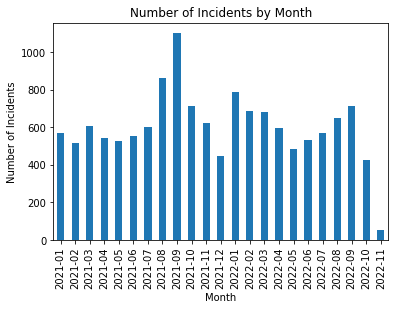

In [485]:

df['month'] = pd.to_datetime(df['opened_at']).dt.to_period('M')
incidents_by_month = df.groupby('month')['incident_number'].count()
incidents_by_month.plot(kind='bar')
plt.title('Number of Incidents by Month')
plt.xlabel('Month')
plt.ylabel('Number of Incidents')
plt.show()